In [ ]:
# COMMON IMPORTS

import pandas as pd
#import cupy as np
import numpy as np
import seaborn as sns

# imports for models : ( source Colab Lecture Code )
#%matplotlib notebook
%matplotlib inline
import matplotlib.pyplot as plt
from IPython.core.debugger import set_trace
import warnings
warnings.filterwarnings('ignore')

from pathlib import Path

import joblib

#Task 1 - Acquire and Preprocess the IMDB Data
The data was aquired from [this source](http://ai.stanford.edu/~amaas/data/sentiment/)


## Task 1.1 - Download and Vectorize Data


## Task 1.1.1 - Download the Data

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# untar and extract data 
!curl -o aclImdb_v1.tar.gz 'http://ai.stanford.edu/~amaas/data/sentiment/aclImdb_v1.tar.gz'
!tar xzf  aclImdb_v1.tar.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 80.2M  100 80.2M    0     0  8835k      0  0:00:09  0:00:09 --:--:-- 17.1M


From README.txt:

The core dataset contains 50,000 reviews split evenly into 25k train
and 25k test sets. The overall distribution of labels is balanced (25k
pos and 25k neg), with 12.5k positive and negative reviews in the training and testing sets as well.

In order to be able to train and test our model, we need the data to be inside a training and a testing array, for both x and y values. This data needs to be vectorized so for our model to be able to operate on it. To vectorize it in a space efficient manner, we use the SciKit Learn `CountVectorizer()`, which returns a compressed spare row matrix representing the data. At first, we perform no feature selection, so the number of features is equal to the vocabulary size found when analysing the data - which is over 50,000 features. Feature selection is investigated in Section 1.2. 

The data is combined into the following arrays so that it can be used for training and testing:

- `x_train_raw` - the movie review training data. Order does not matter, so this matrix is made of the all of the negative movie reviews followed by all of the positive ones. $12500 \times D$
- `x_test_raw` - the movie review testing data, similarily stacked to the training data with the negative reviews first, followed by the postive ones. $12500 \times D$. However, to extract this data, we have to make sure that the testing data uses the same features as the training data, which will be enforced by the using the same `CountVectorizer()` object on the test data. 
- `y_data` - common to both the training and testing data. The first 12500 entries are 0 to indicate a negative review, and the next 12500 are 1 to indicate a postive review. $1 \times 25000$

A compressed sparse row matrix is an instance of the `scipy.sparse.csr_matrix` class, and is used to efficiently represent data with a lot of 0s. Each row is a document ( or a review in our case ), and each collumn is a feature ( or word ). See more about sparse matricies [here](https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.csr_matrix.html#scipy.sparse.csr_matrix), and see how the values work [here](https://www.w3schools.com/python/scipy/scipy_sparse_data.php)

Each value in a sparse matrix is reprsented as `(row,col) value`, and only non zero values are given a value. This allows for very efficient storage of a large matrix if there are a lot of 0s inside it. 




In [ ]:
# lists to store reviews for training and testing
train = []
test = []

# for analysis
names = []



# read files, with negative read first
for p in Path('/content/aclImdb/train/neg').glob('*.txt'):
    train.append(p.read_text())

for p in Path('/content/aclImdb/train/pos').glob('*.txt'):
    train.append(p.read_text())
    
for p in Path('/content/aclImdb/test/neg').glob('*.txt'):
    test.append(p.read_text())

for p in Path('/content/aclImdb/test/pos').glob('*.txt'):
    test.append(p.read_text())


# Vectorizer object to be used for training and testing
vectorizer = CountVectorizer()

# generating tokens for train set
x_train_raw = vectorizer.fit_transform(train)
# print(vectorizer.get_feature_names_out()[10000:10010]) # 10 tokens from the middle

# generating tokens for the test set
x_test_raw = vectorizer.transform(test)
# print(vectorizer.get_feature_names_out()[10000:10010]) # 10 tokens from the middle

print("Raw data shape:", x_train_raw.toarray().shape)


# train and test set for y 
zeros = np.zeros((12500,1))
ones = np.ones((12500,1))
y_data= np.vstack((zeros,ones))[:,0]
print("Classes shape: ",y_data.shape)



Raw data shape: (25000, 74849)
Classes shape:  (25000,)


## Task 1.2 - Preprocessing and Feature Selection

### Task 1.2.1 - Understanding CSR Matrices

Sparse matricies are used to represent matricies where many values are 0. However, they can be treated very similar to numpy matricies for most operations. Below is how they work:

Each row in the sparse matrix is a review. The row can be accessed with `sparse_matrix_name[rowindex]`, and adding `.size` will tell you how many words there are in that review. A few other hand methods: 
- `.indicies`- return all the column indicies that have words
- `.indptr` - return the starting and ending points in a row
- `.data` - return the data of a particular row - all the non zero values


In [ ]:
# understanding how CSR matricies work
# print(type(x_train_raw))
# print(x_train_raw[0].size)
# print(x_train_raw[0].indices)
# print(x_train_raw[0].indptr)
# print(x_train_raw[0].data)
# print(x_train_raw[0].data[0:15])

### Task 1.2.2 - Analysing Data

NOTE - Can only be run once without crashing RAM

We can investigate the words that have the highest frequency in the dataset, with the aim to elimiate words like `the`, `and`, `it`, which would have no effect on whether the review was positive or negative, but could occur in all reviews very frequently. Let us begin by plotting the most frequent words in the dataset. This method was inspired by [this website](https://dev.to/manifoldmindaway/imdb-sentiment-modeling-with-the-countvectorizer-5g1n)


Text(0.5, 0, 'Word Count')

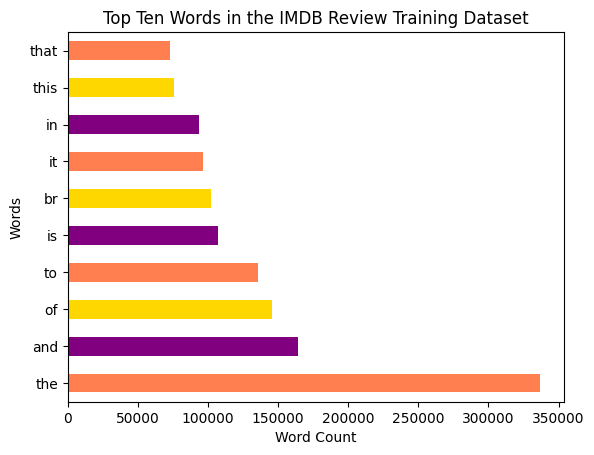

In [ ]:
# This code is commented out because it uses a lot of RAM

# df_cv = pd.DataFrame(x_train_raw.toarray(), columns=vectorizer.get_feature_names_out())
# df_cv.sum().sort_values(ascending=False)[:10].plot(kind='barh', title='Top Ten Words in the IMDB Review Training Dataset', 
#                                                   ylabel='Word Count', xlabel='Words',color=['coral', 'purple', 'gold', 'coral', 'purple', 'gold','coral', 'purple', 'gold', 'coral']);
# plt.xlabel("Word Count")

### Task 1.2.3 - Feature Selection By Eliminating Words That Occur in too Few Documents

Words that occur in on a select few documents add noise to the dataset, and force probability calculations that include them in every other document. We will investigate eliminating them before investigating elimintating words that occur in too many documents

This will give us the following data:
- `x_train_fs2` and `x_test_fs2` - two lists containing training and testing sets starting with eliminating features that occur in less than 0.1%, 0.25%, 0.5%, 1%, 3%, and 5% of the documents

In [ ]:
x_train_fs2 = []
x_test_fs2 = []


# 0%
print("No words eliminated")
vf001 = CountVectorizer( )
x_train_fs2.append(vf001.fit_transform(train))
x_test_fs2.append(vf001.transform(test))
print(vf001.stop_words_)

# 0.1%
print("Eliminated words that occured in less than 0.1% of reviews")
vf001 = CountVectorizer( min_df=0.001 )
x_train_fs2.append(vf001.fit_transform(train))
x_test_fs2.append(vf001.transform(test))
print(vf001.stop_words_)

# 0.25%
print("Eliminated words that occured in less than 0.25% of reviews")
vf0025 = CountVectorizer(min_df=0.0025 )
x_train_fs2.append(vf0025.fit_transform(train))
x_test_fs2.append(vf0025.transform(test))
print(vf0025.stop_words_)

# 0.5%
print("Eliminated words that occured in less than 0.5% of reviews")
vf005 = CountVectorizer( min_df=0.005 )
x_train_fs2.append(vf005.fit_transform(train))
x_test_fs2.append(vf005.transform(test))
print(vf005.stop_words_)

# 1%
print("Eliminated words that occured in less than 1% of reviews")
vf01 = CountVectorizer( min_df=0.01 )
x_train_fs2.append(vf01.fit_transform(train))
x_test_fs2.append(vf01.transform(test))
print(vf01.stop_words_)

# 3%
print("Eliminated words that occured in less than 3% of reviews")
vf03 = CountVectorizer( min_df=0.03 )
x_train_fs2.append(vf03.fit_transform(train))
x_test_fs2.append(vf03.transform(test))
print(vf03.stop_words_)

# 5%
print("Eliminated words that occured in less than 5% of reviews")
vf05 = CountVectorizer(min_df=0.05 )
x_train_fs2.append(vf05.fit_transform(train))
x_test_fs2.append(vf05.transform(test))
print(vf05.stop_words_)




No words eliminated
set()
Eliminated words that occured in less than 0.1% of reviews
{'horns', 'faridany', 'menelaus', 'capas', 'laundered', 'marchal', 'conversely', 'hoyos', 'pele', 'poésy', 'masak', 'traverses', 'exercising', 'glieb', 'colloquial', 'disused', 'hé', 'saskatchewan', 'escalates', 'censure', 'vampress', 'fuhrer', 'pryors', 'tens', 'toughest', 'lipstick', 'heeeeaaarrt', 'canning', 'lizzie', 'waller', 'bobb', 'higuchi', 'allotting', 'softies', 'aire', 'llydia', 'oyelowo', 'deathless', 'predisposed', 'retells', 'mervyn', 'crystalline', 'unimpeachable', 'chandulal', 'driller', 'abysymal', 'karfreitag', 'choreographing', 'cowie', 'stewards', 'aeneid', 'variable', 'stocks', 'candles', 'schlonged', 'operatives', 'hinge', 'closeness', 'signify', 'powerless', 'blackmoor', 'malco', 'politbiro', 'betraying', 'corroboration', 'natures', 'bedded', 'pathologically', 'dives', 'presumption', 'auh', 'quietus', 'kamiki', 'gromit', 'doctrinal', 'imaginatively', 'kaliganj', 'odors', 'parme'

### Task 1.2.4 - Feature Selection By Eliminating Wrods that Occur in too Many Documents

We now remove features that occur in x% of the documents and see what words are removed. We will do so by also eliminating words that occur in less than 2.5% of the documents at the same time, as shown in results from Task 1.2.3 and Task 3.1.1. This will give us the following data:
- `x_train_fs` and `x_test_fs` - two lists containing training and testing sets starting with eliminating features that occur in more than 30% of all documents and incrementing it all the way to 90%.  

In [ ]:
x_train_fs = []
x_test_fs = []

# 30% - too much 
print("Eliminated words that occured in more than 30% of reviews")
vf30 = CountVectorizer(max_df = 0.30, min_df = 0.0025)
x_train_fs.append(vf30.fit_transform(train))
x_test_fs.append(vf30.transform(test))
print(vf30.stop_words_)

# 40% 
print("Eliminated words that occured in more than 40% of reviews")
vf40 = CountVectorizer(max_df = 0.40, min_df = 0.0025)
x_train_fs.append(vf40.fit_transform(train))
x_test_fs.append(vf40.transform(test))
print(vf40.stop_words_)

#50%
print("Eliminated words that occured in more than 50% of reviews")
vf50 = CountVectorizer(max_df = 0.5, min_df = 0.0025)
x_train_fs.append(vf50.fit_transform(train))
x_test_fs.append(vf50.transform(test))
print(vf50.stop_words_)

# 60%
print("Eliminated words that occured in more than 60% of reviews")
vf60 = CountVectorizer(max_df = 0.6, min_df = 0.0025)
x_train_fs.append(vf60.fit_transform(train))
x_test_fs.append(vf60.transform(test))
print(vf60.stop_words_)

# 70%
print("Eliminated words that occured in more than 70% of reviews")
vf70 = CountVectorizer(max_df = 0.7, min_df = 0.0025)
x_train_fs.append(vf70.fit_transform(train))
x_test_fs.append(vf70.transform(test))
print(vf70.stop_words_)

# 80%
print("Eliminated words that occured in more than 80% of reviews")
vf80 = CountVectorizer(max_df = 0.8, min_df = 0.0025)
x_train_fs.append(vf80.fit_transform(train))
x_test_fs.append(vf80.transform(test))
print(vf80.stop_words_)

# 90%
print("Eliminated words that occured in more than 90% of reviews")
vf90 = CountVectorizer(max_df = 0.9, min_df = 0.0025)
x_train_fs.append(vf90.fit_transform(train))
x_test_fs.append(vf90.transform(test))
print(vf90.stop_words_)

# analyse the one we end up using
x_train_fs[1].toarray().shape


Eliminated words that occured in more than 30% of reviews
{'horns', 'faridany', 'menelaus', 'capas', 'laundered', 'marchal', 'conversely', 'hoyos', 'pele', 'poésy', 'masak', 'traverses', 'exercising', 'squeamish', 'colloquial', 'glieb', 'liam', 'disused', 'hé', 'saskatchewan', 'escalates', 'censure', 'vampress', 'fuhrer', 'pryors', 'tens', 'toughest', 'lipstick', 'heeeeaaarrt', 'canning', 'lizzie', '1937', 'bobb', 'waller', 'allotting', 'softies', 'higuchi', 'aire', 'llydia', 'oyelowo', 'deathless', 'predisposed', 'retells', 'mervyn', 'crystalline', 'unimpeachable', 'chandulal', 'driller', 'abysymal', 'karfreitag', 'choreographing', 'cowie', 'stewards', 'snippets', 'variable', 'stocks', 'worship', 'schlonged', 'candles', 'operatives', 'hinge', 'closeness', 'signify', 'powerless', 'mcdermott', 'blackmoor', 'malco', 'politbiro', 'betraying', 'corroboration', 'natures', 'bedded', 'pathologically', 'dives', 'presumption', 'auh', 'quietus', 'kamiki', 'gromit', 'doctrinal', 'imaginatively', 

(25000, 5415)

### Task 1.2.5 - Feature Selection By Eliminating Words Common to Both Classes

This is on top of eliminating words that are too frequent or infrequent.

Splitting train and test data into positive and negative classes

In [ ]:
train_neg = np.array(train[:12500])
train_pos = np.array(train[12500:])

test_neg = np.array(test[:12500])
test_pos = np.array(test[12500:])

Splitting features into "frequency classes" for both positive and negative reviews. The hyperparameter `class_size` indicates the % over which each class will cover.

For example, with `class_size = 1`, words are split into "buckets" of 1% per class (0-1%, 1-2%, ..., 39-40%). Any word located in the same frequency "bucket" for positive/negative reviews will be added to `common_stop_words`.

In addition, we automatically exclude the lowest frequency features (<0.25% frequency based on 1.2.3) and highest frequency (>40% from 1.2.4), since little to no similarity between buckets can be found at the high frequencies.

NOTE: this implementation is unstable due to RAM limitations in Colab. To get around this, I have imported the `joblib` package which allows for the storage of `common_stop_words` for later reference (see 3.1.3 for loading from a .pkl file). What this means is **should the Colab crash after the execution of this block, it does not need to be run again in the same runtime**. Simply run the code before and after it, and the results of this feature extraction will be read from the stored values.

In [ ]:
# % boundaries at which we will split the stop words into frequency classes.
class_size = 0.75
# results so far are:
# - 84.88% test accuracy for class_size = 0.25 (70982 features eliminated)
# - 85.18% test accuracy for class_size = 0.5 (72183 features eliminated)
# - 85.27% test accuracy for class_size = 0.75 (72949 features eliminated)
# - 85.05% test accuracy for class_size = 1 (73420 features eliminated)
# - 83.47% test accuracy for class_size = 2 (74141 features eliminated)
# worth trying some more, but also note that for every decrease in class_size by a factor of 2, runtime doubles
frequency_margins = np.arange(class_size, 40, class_size)

common_stop_words = np.array(list(vf40.stop_words_))
prev_neg_stop_words = common_stop_words
prev_pos_stop_words = common_stop_words

for margin in frequency_margins:
    margin_pct = margin / 100.0
    vect_neg_common = CountVectorizer(min_df = margin_pct)
    vect_pos_common = CountVectorizer(min_df = margin_pct)
    vect_neg_common.fit_transform(train_neg)
    vect_neg_common.transform(test_neg)
    vect_pos_common.fit_transform(train_pos)
    vect_pos_common.transform(test_pos)

    # reassigning stop words
    neg_stop_words = np.array(list(vect_neg_common.stop_words_))
    pos_stop_words = np.array(list(vect_pos_common.stop_words_))

    # removing all low frequency words
    curr_neg_stop_words = np.setdiff1d(neg_stop_words, prev_neg_stop_words, assume_unique=True)
    curr_pos_stop_words = np.setdiff1d(pos_stop_words, prev_pos_stop_words, assume_unique=True)

    prev_neg_stop_words = neg_stop_words
    prev_pos_stop_words = pos_stop_words
    
    # print(f"Words that occurred in less than {margin} % of negative reviews:")
    # print(curr_neg_stop_words)
    # print(f"Words that occurred in less than {margin} % of positive reviews:")
    # print(curr_pos_stop_words)

    same_frequency_words = np.intersect1d(curr_neg_stop_words, curr_pos_stop_words)
    print(f'{same_frequency_words.shape[0]} words eliminated at the {margin} percentile')
    common_stop_words = np.concatenate((common_stop_words, same_frequency_words))

joblib.dump(common_stop_words, 'same_frequency_words.pkl')

2746 words eliminated at the 0.75 percentile
508 words eliminated at the 1.5 percentile
127 words eliminated at the 2.25 percentile
49 words eliminated at the 3.0 percentile
32 words eliminated at the 3.75 percentile
13 words eliminated at the 4.5 percentile
7 words eliminated at the 5.25 percentile
8 words eliminated at the 6.0 percentile
4 words eliminated at the 6.75 percentile
2 words eliminated at the 7.5 percentile
3 words eliminated at the 8.25 percentile
4 words eliminated at the 9.0 percentile
0 words eliminated at the 9.75 percentile
0 words eliminated at the 10.5 percentile
1 words eliminated at the 11.25 percentile
2 words eliminated at the 12.0 percentile
0 words eliminated at the 12.75 percentile
1 words eliminated at the 13.5 percentile
1 words eliminated at the 14.25 percentile
1 words eliminated at the 15.0 percentile
0 words eliminated at the 15.75 percentile
1 words eliminated at the 16.5 percentile
0 words eliminated at the 17.25 percentile
0 words eliminated at the

['same_frequency_words.pkl']

# Task 2 - Naive Bayes Models

In this section, we create one Naive Bayes Class, which can implement 3 different models: 
- Naive Bayes - implemented as the Bayesian Naive Bayes with `alpha` and `beta` set to 0, with no smoothing
- Bayesian Naive Bayes - Similar to Naive Bayes, but maintains a probability distribution for the prior and likelihood. This results in the `alpha` and `beta` parameters for smoothing that are non 0.
- Multinomial Naive Bayes - Takes into account the frequency in which words occur, rather than just whether or not they occur. This changes the way in which the likelihood term is calculated




## Evaluate Accuracy

In [ ]:
def eval_acc(yh, y):
    return (yh == y).sum() / y.shape[0]

## Task 2.1 -Naive Bayes Model Class - Normal, Bayesian and Multinomial

This class implements the Normal and Naive Bayes classifiers. The class takes in two parameters: 
- `alpha` - first parameter for smoothing
- `beta` - second parameter for smoothing
- `model` - either `normal` for a Normal / Bayesian Naive Bayes model, or `multinomial` for a Multinomial Naive Bayes Model

The class implements the following functions: 
- `fit` - given the inputs `x` and `y`, the model learns a prior distribution as well as $ 2 \times D $ likelihood parameters for all of the $D$ features that are present in all documents. 
- `predict` - given the input `x`, this function outputs the predictions $\hat{y}$ for each instance in x. However, since there are so many probabilities to deal with, numerical issues are guaranteed. An inefficient implementation is used to demonstrate this, and it is not worth optimizing. 
- `predict_log` - this implementation uses log probabilities to avoid numerical issues. Because we are using log probabilities, we can use the `.dot()` product to compute probabilities more efficiently for many instances at a time. To avoid looping over each instance individually, the method works as follows: 
    - In order to compute the probability for multiple values at a time, we will first compute the likelihood for all words that are present in the document ( indicated with ones ) by doing the dot product between the test dataset and the likelihood probabilities.
    - We will then invert the ones with 0s in the matrix, and do the dot product between the test data and 1 - the likelihood probabilities
    - We then multiply these two things together, with the prior as well, to get the probability the data is either in class 1 or class 0. We then classify it based on the higher probability
    - To do this, we will split the data into 100 parts to do this so that we don't overwhelm RAM. 


In [ ]:
from pandas.io.formats.info import TableBuilderVerboseMixin
import scipy as sc

# log sum exp function to prevent numerical issues
def logsumexp(Z):
    Zmax = np.max(Z)
    log_sum_exp = Zmax + np.log(np.sum(np.exp(Z - Zmax)))
    return log_sum_exp

# naive bayes class with optional to add smoothing with alpha and beta
class NaiveBayes:
    
    # alpha and beta for bayesian naive bayes. 
    def __init__(self, _alpha=1, _beta=1, model='normal'):
        self.alpha = _alpha
        self.beta = _beta
        if (model == "multinomial" or model == "normal"): 
            self.model = model
        else: 
            raise ValueError("Invalid value for model parameter 'model'. Can either be 'normal' for Normal / Bayesian, or 'multnomial' for Multinomial")
        
    
    def fit(self, x, y):
        N, D = x.shape

        # copy x and replace non zero values with 1 if its a Normal / Bayesian Naive Bayes Model
        if (self.model == "normal"):
            x = x.copy()
            x[x.nonzero()] = 1

        # Laplace smoothing
        self.prior = (x[y == 1].shape[0] + self.alpha) / (N + self.alpha + self.beta)
        # one parameter for each feature for each binary class (0/1)
        self.likelihood = np.zeros((2, D))
        for binary_class in range(2):
            # count instances of the dth word in reviews where y == binary_class. Same for both 'n' and 'm'
            numerator = (x[y == binary_class,:]).sum(axis=0)

            # count the number of documents in the class for 'n', or the total number of words for 'm'
            if (self.model == 'normal'):
                denominator = (x[y == binary_class].shape[0])
            else: 
                denominator = numerator.sum()
            # assign the liklihood for the whole class at once
            self.likelihood[binary_class,:] = (np.array(numerator) + self.alpha) / (np.array(denominator) + self.alpha + self.beta)
        
        return self
    
    def predict(self, xt):
        if (self.model == "normal"):
            xt = xt.copy()
            xt[xt.nonzero()] = 1

        listOfPredictions = []
        Nt, D = xt.shape

        # copy the likelihood so that we can adjust it for cases with 1 - probability 
        likelihood = np.zeros((Nt, 2, D))

        for n in range(Nt):
            for binary_class in range(2):
                for d in range(D):
                    if (type(xt) == type (sc.sparse.csr_matrix([1]))):
                        data = xt.getrow(n).toarray()
                        likelihood[n, binary_class, d] = self.likelihood[binary_class, d] if data[0,d] == 1 else 1 - self.likelihood[binary_class, d]
                    else: 
                        likelihood[n, binary_class, d] = self.likelihood[binary_class, d] if xt[n,d] == 1 else 1 - self.likelihood[binary_class, d] 
        # print(likelihood)
        likelihood = np.product(likelihood, axis=2)
        
        # posterior calculation
        posterior = np.array([1 - self.prior, self.prior]) * likelihood

        yhat = posterior.argmax(axis=1)
        return yhat

    def predict_log(self, xt):
    
        xt = xt.copy()
        xt[xt.nonzero()] = 1
        Nt, D = xt.shape
        
        # for numerical stability we work in the log domain
        log_prior = np.log(np.array([1 - self.prior, self.prior]))
        
        log_likelihood = np.log(self.likelihood.copy())
        inverse_log_likelihood = np.log(1 - self.likelihood.copy())

        yhatList = []

        # split the data so that RAM can manage it

        batchSize = Nt // 100
        lowerLimit = 0
        upperLimit = batchSize
        counter = 0

        while lowerLimit < Nt:
            # create batches of data and inverse data
            data = xt[lowerLimit:upperLimit,:]
            inverseData = data.copy()
            
            if (self.model == "normal"): 
                inverseData[data == 1] = 0
            else:
                inverseData[data >= 1] = 0
            
            inverseData[data == 0] = 1

            # words that are present
            arePresent = data.dot(log_likelihood.T)
            # words that are not present 
            notPresent = inverseData.dot(inverse_log_likelihood.T)

            # combine them 
            bothPresent = arePresent + notPresent
            
            # add log priors
            log_posterior = bothPresent + log_prior

            # find yhat and append it to list.
            yhat = log_posterior.argmax(axis=1)
            yhatList.append(yhat)
            # update limits
            lowerLimit = upperLimit
            upperLimit = min(Nt, upperLimit + batchSize)

        # combine all the yhat arrays into a single array
        yhatArray = np.concatenate(yhatList, axis=0)
        return yhatArray





### 2.1.1 - Simple Test
Testing on simple values from slides

In [ ]:
# Test on example from class slides
model = NaiveBayes(_alpha=0, _beta=0)

x = np.array([[1, 1, 1, 0, 0, 1, 0],
             [1, 1, 0, 0, 0, 1, 0],
             [1, 1, 0, 1, 0, 1, 0],
             [0, 1, 0, 0, 1, 1, 1],
             [1, 1, 0, 0, 0, 1, 0]])

# Classes for each x
y = np.array([1, 1, 1, 1, 0])

# fit the model and analyse results
model.fit(x, y)
print(f'Prior: {model.prior}')
print(f'Likelihood:\n{model.likelihood}')

# test predict
xt = np.array([[1, 0, 0, 0, 0, 1, 0],[1, 0, 0, 0, 0, 1, 0]])
print(f'Posterior:\n{model.predict(xt)}')
# print(f'Posterior (using log):\n{model.predict_log(xt)}')

# Check to see effect of laplace smoothing
model2 = NaiveBayes(_alpha=1, _beta=1)
model2.fit(x, y)

xt = np.array([[1, 0, 0, 0, 0, 1, 0],[1, 0, 0, 0, 0, 1, 0]])

print(f'Posterior:\n{model2.predict(xt)}')
# print(f'Posterior (using log):\n{model2.predict_log(xt)}')

Prior: 0.8
Likelihood:
[[1.   1.   0.   0.   0.   1.   0.  ]
 [0.75 1.   0.25 0.25 0.25 1.   0.25]]
Posterior:
[0 0]
Posterior:
[1 1]


#Task 3 - Experiements

Below is common code used to plot and analyse results for the Naive Bayes models

In [ ]:
def plotAccuracy(testAccuracies, trainAccuracies, xaxis, labels, colors): 
    # Plot the test accuracies as a line chart
    plt.plot(xaxis, testAccuracies, color=colors[0], label='test')

    # Plot the training accuracies as a line chart
    plt.plot(xaxis, trainAccuracies, color=colors[1], label='train')

    # Set the chart title and axis labels
    plt.title(labels[0])
    plt.xlabel(labels[1])
    plt.ylabel(labels[2])



    # Add a legend
    plt.legend()

    # Show the plot
    plt.show()


## Task 3.1 - Feature Selection




### Task 3.1.1 - Feature Selection By Elminiating Words that Occur in too Few Documents

We will first see which kind of feature selection gives the best results, so that we can use those features for all future tests for the highest accuracy. We will do this with laplace smoothing, i.e setting `alpha` = `beta` = 1

In [ ]:
# loop over all training and test sets and evaluate accuracy on each of them
testAccuracies = []
trainAccuracies = []
percentage = [0,0.1,0.25,0.5,1,3,5]

for i in range(7):
    # get the feature selected data
    trainData = x_train_fs2[i]
    testData = x_test_fs2[i]
    # create and train model
    model = NaiveBayes(_alpha=1, _beta=1,model='normal')
    model.fit(trainData, y_data)
    # get results and find accuracy
    testResults = model.predict_log(testData)
    testAccuracy = eval_acc(testResults, y_data)
    print("Test accuracy for ", percentage[i], "% : ", testAccuracy)
    trainResults = model.predict_log(trainData)
    trainAccuracy = eval_acc(trainResults, y_data)
    print("Train accuracy for ", percentage[i], "% : ", trainAccuracy)
    # append to list
    testAccuracies.append(testAccuracy)
    trainAccuracies.append(trainAccuracy)

Test accuracy for  0 % :  0.82596
Train accuracy for  0 % :  0.90496
Test accuracy for  0.1 % :  0.84008
Train accuracy for  0.1 % :  0.86764
Test accuracy for  0.25 % :  0.8428
Train accuracy for  0.25 % :  0.85996
Test accuracy for  0.5 % :  0.84084
Train accuracy for  0.5 % :  0.85448
Test accuracy for  1 % :  0.8332
Train accuracy for  1 % :  0.8406
Test accuracy for  3 % :  0.79872
Train accuracy for  3 % :  0.80244
Test accuracy for  5 % :  0.7724
Train accuracy for  5 % :  0.77804


Now that we have trained the model, we can plot the accuracy

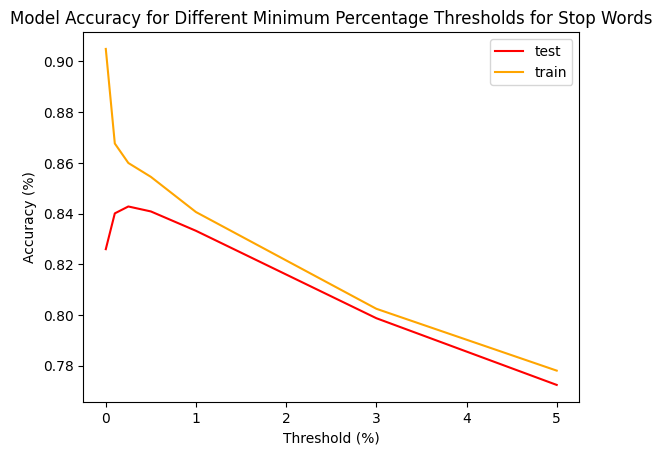

In [ ]:
# plot results 
labels = ["Model Accuracy for Different Minimum Percentage Thresholds for Stop Words", "Threshold (%)","Accuracy (%)"]
plotAccuracy(testAccuracies, trainAccuracies, xaxis = percentage, labels = labels, colors = ['red','orange'])

### Task 3.1.2 - Feature Selection by Words That Occur in Too Many Documents

Now that we know the minimum threshold for which we can eliminate words, we can investigate the maximum percentage threshold. This is also for a Bayesian Naive Basyes model, with alpha and beta = 1 (laplace smoothing)

In [ ]:
# loop over all training and test sets and evaluate accuracy on each of them

testAccuracies = []
trainAccuracies = []
percentage = [i for i in range (30,100, 10)]

for i in range(7):
    # get the feature selected data
    trainData = x_train_fs[i]
    testData = x_test_fs[i]
    # create and train model
    model = NaiveBayes(_alpha=1, _beta=1,model='normal')
    model.fit(trainData, y_data)
    # get results and find accuracy
    testResults = model.predict_log(testData)
    testAccuracy = eval_acc(testResults, y_data)
    print("Test accuracy for ", percentage[i], "% : ", testAccuracy)
    trainResults = model.predict_log(trainData)
    trainAccuracy = eval_acc(trainResults, y_data)
    print("Train accuracy for ", percentage[i], "% : ", trainAccuracy)
    # append to list
    testAccuracies.append(testAccuracy)
    trainAccuracies.append(trainAccuracy)



Test accuracy for  30 % :  0.84552
Train accuracy for  30 % :  0.86236
Test accuracy for  40 % :  0.847
Train accuracy for  40 % :  0.86464
Test accuracy for  50 % :  0.84432
Train accuracy for  50 % :  0.86124
Test accuracy for  60 % :  0.84384
Train accuracy for  60 % :  0.86128
Test accuracy for  70 % :  0.843
Train accuracy for  70 % :  0.86024
Test accuracy for  80 % :  0.84292
Train accuracy for  80 % :  0.86012
Test accuracy for  90 % :  0.84268
Train accuracy for  90 % :  0.85988


Now that we have obtained accuracies for each of the feature selected datasets, we can plot the results

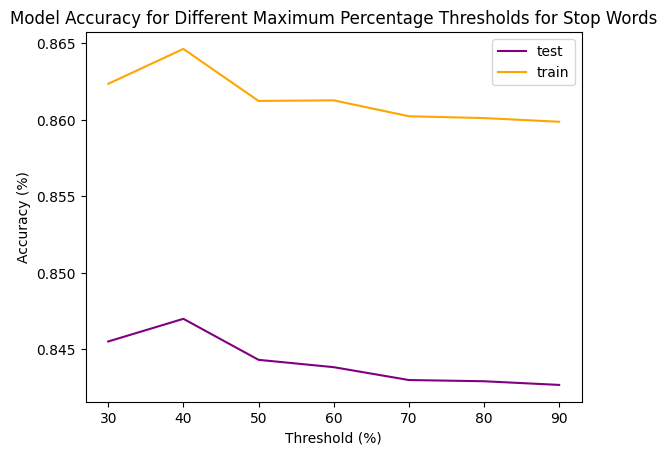

In [ ]:
# plot results 
labels = ["Model Accuracy for Different Maximum Percentage Thresholds for Stop Words", "Threshold (%)","Accuracy (%)"]
plotAccuracy(testAccuracies, trainAccuracies, xaxis = percentage, labels = labels, colors = ['purple','orange'])

### Task 3.1.3 - Feature Selection By Eliminating Words Common to Both Classes



In [ ]:
same_frequency_words = joblib.load('same_frequency_words.pkl')
print(f'features eliminated: {same_frequency_words.shape[0]}')
vf_common = CountVectorizer(stop_words=list(same_frequency_words))


# get the feature selected data
trainData = vf_common.fit_transform(train)
testData = vf_common.transform(test)
# create and train model
model = NaiveBayes(_alpha=1, _beta=1,model='normal')
model.fit(trainData, y_data)
# get results and find accuracy
testResults = model.predict_log(testData)
testAccuracy = eval_acc(testResults, y_data)
print("Test accuracy for common word elimination: ", testAccuracy)
trainResults = model.predict_log(trainData)
trainAccuracy = eval_acc(trainResults, y_data)
print("Train accuracy for common word elimination: ", trainAccuracy)

features eliminated: 72949
Test accuracy for common word elimination:  0.85272
Train accuracy for common word elimination:  0.86312


## Task 3.2 - Comparing Bayesian Naive Bayes for Different Amounts of Smoothing



### Task 3.2.1 - Alpha and Beta values in a Large Range

We will now compare which values of `alpha` and `beta` give the best test accuracy, so that they can also be set for future experiments. We will go with the assumption that alpha and beta are always the same. Exploring different combinations of them would have been something else we could have done in the future

First, we will explore values of alpha and beta over a large range

In [ ]:
testSmoothing = []
trainSmoothing = []
alphaBeta = [0,0.5,1,10,20,30,40,50]
# get the feature selected data that is the best

same_frequency_words = joblib.load('same_frequency_words.pkl')
print(f'features eliminated: {same_frequency_words.shape[0]}')
vf_common = CountVectorizer(stop_words=list(same_frequency_words))
trainData = vf_common.fit_transform(train)
testData = vf_common.transform(test)

for i in range(8):
    # create and train model
    model = NaiveBayes(_alpha=alphaBeta[i], _beta=alphaBeta[i],model='normal')
    model.fit(trainData, y_data)
    # get results and find accuracy
    testResults = model.predict_log(testData)
    testAccuracy = eval_acc(testResults, y_data)
    print("Test accuracy for alpha/beta = ", alphaBeta[i], " : ", testAccuracy)
    trainResults = model.predict_log(trainData)
    trainAccuracy = eval_acc(trainResults, y_data)
    print("Train accuracy for alpha/beta = ", alphaBeta[i], " : ", trainAccuracy)
    # append to list
    testSmoothing.append(testAccuracy)
    trainSmoothing.append(trainAccuracy)

features eliminated: 72949
Test accuracy for alpha/beta =  0  :  0.85288
Train accuracy for alpha/beta =  0  :  0.8632
Test accuracy for alpha/beta =  0.5  :  0.8528
Train accuracy for alpha/beta =  0.5  :  0.86324
Test accuracy for alpha/beta =  1  :  0.85272
Train accuracy for alpha/beta =  1  :  0.86312
Test accuracy for alpha/beta =  10  :  0.85264
Train accuracy for alpha/beta =  10  :  0.86208
Test accuracy for alpha/beta =  20  :  0.85168
Train accuracy for alpha/beta =  20  :  0.86104
Test accuracy for alpha/beta =  30  :  0.85136
Train accuracy for alpha/beta =  30  :  0.85976
Test accuracy for alpha/beta =  40  :  0.85068
Train accuracy for alpha/beta =  40  :  0.85884
Test accuracy for alpha/beta =  50  :  0.85052
Train accuracy for alpha/beta =  50  :  0.85788


Now that we have gotten the accuracies, we can plot them to show the results

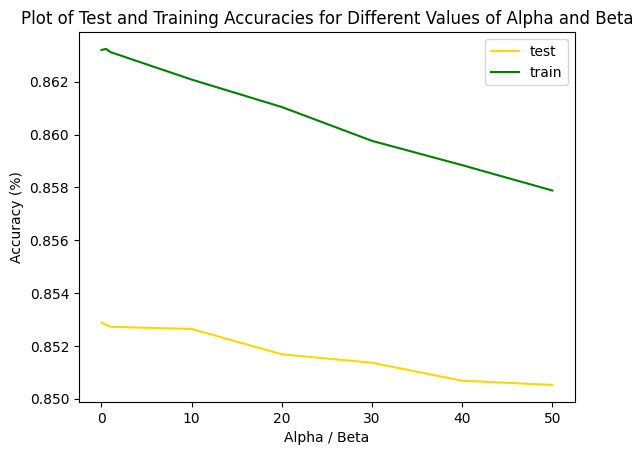

In [ ]:
# plot results 
labels = ["Plot of Test and Training Accuracies for Different Values of Alpha and Beta", "Alpha / Beta","Accuracy (%)"]
plotAccuracy(testSmoothing, trainSmoothing,xaxis = alphaBeta,labels = labels, colors = ['gold','green'])

### Task 3.2.2 - Alpha and Beta Values in a Smaller Range
Next, we will explore the apha and beta values within the range of between 0 and 1, clearly the most interesting range according to teh previous graph

In [ ]:
testSmoothing = []
trainSmoothing = []
alphaBeta = [i/10 for i in range (0,11,1)]
# get the feature selected data 
same_frequency_words = joblib.load('same_frequency_words.pkl')
print(f'features eliminated: {same_frequency_words.shape[0]}')
vf_common = CountVectorizer(stop_words=list(same_frequency_words))
trainData = vf_common.fit_transform(train)
testData = vf_common.transform(test)

for i in range(11):
    # create and train model
    model = NaiveBayes(_alpha=alphaBeta[i], _beta=alphaBeta[i],model='normal')
    model.fit(trainData, y_data)
    # get results and find accuracy
    testResults = model.predict_log(testData)
    testAccuracy = eval_acc(testResults, y_data)
    print("Test accuracy for alpha/beta = ", alphaBeta[i], " : ", testAccuracy)
    trainResults = model.predict_log(trainData)
    trainAccuracy = eval_acc(trainResults, y_data)
    print("Train accuracy for alpha/beta = ", alphaBeta[i], " : ", trainAccuracy)
    # append to list
    testSmoothing.append(testAccuracy)
    trainSmoothing.append(trainAccuracy)

features eliminated: 72949
Test accuracy for alpha/beta =  0.0  :  0.85288
Train accuracy for alpha/beta =  0.0  :  0.8632
Test accuracy for alpha/beta =  0.1  :  0.85288
Train accuracy for alpha/beta =  0.1  :  0.8632
Test accuracy for alpha/beta =  0.2  :  0.85292
Train accuracy for alpha/beta =  0.2  :  0.8632
Test accuracy for alpha/beta =  0.3  :  0.85288
Train accuracy for alpha/beta =  0.3  :  0.8632
Test accuracy for alpha/beta =  0.4  :  0.8528
Train accuracy for alpha/beta =  0.4  :  0.8632
Test accuracy for alpha/beta =  0.5  :  0.8528
Train accuracy for alpha/beta =  0.5  :  0.86324
Test accuracy for alpha/beta =  0.6  :  0.85272
Train accuracy for alpha/beta =  0.6  :  0.86324
Test accuracy for alpha/beta =  0.7  :  0.85264
Train accuracy for alpha/beta =  0.7  :  0.86316
Test accuracy for alpha/beta =  0.8  :  0.85264
Train accuracy for alpha/beta =  0.8  :  0.86316
Test accuracy for alpha/beta =  0.9  :  0.85272
Train accuracy for alpha/beta =  0.9  :  0.86316
Test accur

Now we can plot our results

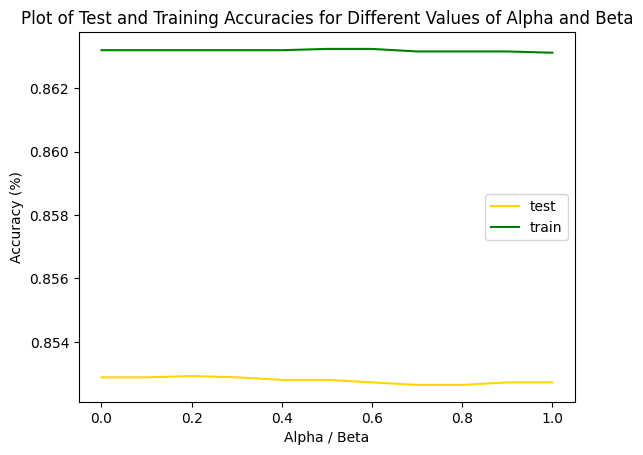

In [ ]:
# plot results 
labels = ["Plot of Test and Training Accuracies for Different Values of Alpha and Beta", "Alpha / Beta","Accuracy (%)"]
plotAccuracy(testSmoothing, trainSmoothing,xaxis = alphaBeta, labels = labels, colors = ['gold','green'])

### Task 3.2.3 - Proof that Smoothing is More Critical with No Feature Selection

Note - will take several hours to run since it is with no feature selection

In [ ]:
testSmoothing = []
trainSmoothing = []
alphaBeta = [i/10 for i in range (0,12,2)]

# get the feature selected data 
trainData = x_train_raw
testData = x_test_raw
for i in range(6):
    # create and train model
    model = NaiveBayes(_alpha=alphaBeta[i], _beta=alphaBeta[i],model='normal')
    model.fit(trainData, y_data)
    # get results and find accuracy
    testResults = model.predict_log(testData)
    testAccuracy = eval_acc(testResults, y_data)
    print("Test accuracy for alpha/beta = ", alphaBeta[i], " : ", testAccuracy)
    trainResults = model.predict_log(trainData)
    trainAccuracy = eval_acc(trainResults, y_data)
    print("Train accuracy for alpha/beta = ", alphaBeta[i], " : ", trainAccuracy)
    # append to list
    testSmoothing.append(testAccuracy)
    trainSmoothing.append(trainAccuracy)

Test accuracy for alpha/beta =  0.0  :  0.65
Train accuracy for alpha/beta =  0.0  :  0.95928
Test accuracy for alpha/beta =  0.2  :  0.8196
Train accuracy for alpha/beta =  0.2  :  0.92476
Test accuracy for alpha/beta =  0.4  :  0.82188
Train accuracy for alpha/beta =  0.4  :  0.91656
Test accuracy for alpha/beta =  0.6  :  0.82376
Train accuracy for alpha/beta =  0.6  :  0.9114
Test accuracy for alpha/beta =  0.8  :  0.82492
Train accuracy for alpha/beta =  0.8  :  0.90792
Test accuracy for alpha/beta =  1.0  :  0.82596
Train accuracy for alpha/beta =  1.0  :  0.90496


Now that we have gotten the accuracies, we can plot them

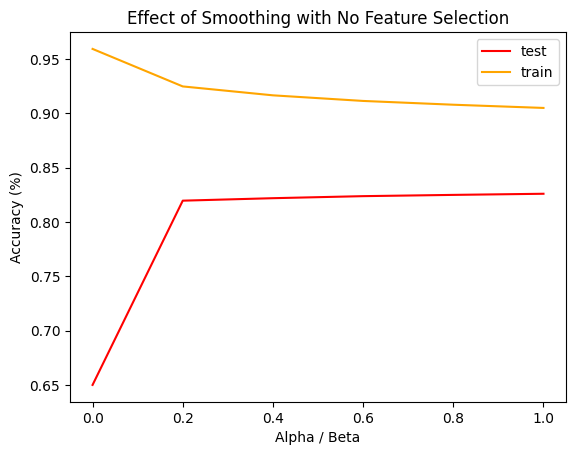

In [ ]:
# plot results 
labels = ["Effect of Smoothing with No Feature Selection", "Alpha / Beta","Accuracy (%)"]
plotAccuracy(testSmoothing, trainSmoothing,xaxis = alphaBeta, labels = labels, colors = ['red','orange'])

## Task 3.3 - Comparing Normal, Bayesian and Multinomial Naive Bayes

Now that we have found the data set with the right amount of feature selection, and we have found good values for alpha and beta, we can compare the three Naive Bayes Models and see how their accuracies compare in a table

In [ ]:
# set parameters
alpha = 0.2
beta = 0.2
# get feature selected data
same_frequency_words = joblib.load('same_frequency_words.pkl')
print(f'features eliminated: {same_frequency_words.shape[0]}')
vf_common = CountVectorizer(stop_words=list(same_frequency_words))
trainData = vf_common.fit_transform(train)
testData = vf_common.transform(test)

# create models with appropriate parameters
modelNormal = NaiveBayes (_alpha = 0, _beta = 0, model = 'normal')
modelBayesian = NaiveBayes (_alpha = alpha, _beta = beta, model = 'normal')
modelMultinomial = NaiveBayes (_alpha = 0, _beta = 0, model = 'multinomial')
modelMultinomialSmooth = NaiveBayes (_alpha = alpha, _beta = beta, model = 'multinomial')

# train models 
modelNormal.fit(trainData, y_data)
modelBayesian.fit(trainData, y_data)
modelMultinomial.fit(trainData, y_data)
modelMultinomialSmooth.fit(trainData, y_data)

# evaluate accuracy of Normal Naive Bayes
trainResults = modelNormal.predict_log(trainData)
testResults = modelNormal.predict_log(testData)
print("Train Accuracy for Normal Model: ", eval_acc(trainResults, y_data))
print("Test Accuracy for Normal Model: ", eval_acc(testResults, y_data))

# evaluate accuracy of Bayesian Naive Bayes
trainResults = modelBayesian.predict_log(trainData)
testResults = modelBayesian.predict_log(testData)
print("Train Accuracy for Bayesian Model: ", eval_acc(trainResults, y_data))
print("Test Accuracy for Bayesian Model: ", eval_acc(testResults, y_data))

# evaluate accuracy of Multinomial Naive Bayes with no smoothing
trainResults = modelMultinomial.predict_log(trainData)
testResults = modelMultinomial.predict_log(testData)
print("Train Accuracy for Multinomial Model: ", eval_acc(trainResults, y_data))
print("Test Accuracy for Multinomial Model: ", eval_acc(testResults, y_data))

# evaluate accuracy of Multinomial Naive Bayes with smoothing
trainResults = modelMultinomialSmooth.predict_log(trainData)
testResults = modelMultinomialSmooth.predict_log(testData)
print("Train Accuracy for Multinomial Model with Smoothing: ", eval_acc(trainResults, y_data))
print("Test Accuracy for Multinomial Model with Smoothing: ", eval_acc(testResults, y_data))




features eliminated: 72949
Train Accuracy for Normal Model:  0.8632
Test Accuracy for Normal Model:  0.85288
Train Accuracy for Bayesian Model:  0.8632
Test Accuracy for Bayesian Model:  0.85292
Train Accuracy for Multinomial Model:  0.86168
Test Accuracy for Multinomial Model:  0.84996
Train Accuracy for Multinomial Model with Smoothing:  0.86168
Test Accuracy for Multinomial Model with Smoothing:  0.84984
